# Data Challenge

# Table of Content

1) Introduction

2) Importing Required Library

3) Data Gathering

4) Data Assesing

5) Data Cleaning

6) Feature Enginering

7) Data Visualization

8) Conclusion

9) Summary

10) Future Recommendation

# 1. Introduction

The goal of the analysis is to provide assistance to a real estate agency to identify which are the most profitable zipcodes in New York City to buy and rent property. The real estate agency has already identify that 2 Bedrooms properties are the best for investment.

Data Source

The data to be used in the analysis comes from two different sources 

1) Airbnb

2). Zillow data: Zip_Zhvi_2bedroom.csv.zip (included in the email from Capital One recruiting)

The brief description of the datasets is as follows:

Airbnb Dataset

Airbnb datset contains information on property listings such as location details, number of bedrooms, room types, services, host details, cleaning fee, rent price details, reviews and ratings.

Zillow Dataset

Zillow dataset provides selling cost for 2 bedroom properties in each zipcode for varios cities. The cost has been shown from April 1996 to June 2017.

The aim of the study will be understand and clean data, perform data visualization and obtain useful information through data mining which can help solve the above business problem

# 2. Importing Required Library

In [53]:
import os
import requests

import pandas as pd
import numpy as np
import geopandas as gpd
from tqdm import tqdm_notebook as tqdm
import missingno as msno

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import joypy

from ipyleaflet import *
from ipyleaflet import Map, basemaps, WidgetControl
from ipywidgets import IntSlider, ColorPicker, jslink
from ipyleaflet import Map, Heatmap

import warnings

%matplotlib inline

mpl.rcParams['figure.figsize'] = (13, 8)
plt.style.use('seaborn-dark')

# 3. Data Gathering

Gather each of the two pieces of data as described above in Introduction section in a Jupyter Notebook titled Capital_One.ipynb:

In [54]:
data_folder_raw = os.path.abspath(os.path.join('..','..','data','raw'))
zip_df = pd.read_csv(os.path.join(data_folder_raw, 'Zip_Zhvi_2bedroom.csv'), index_col='RegionName')
listings_df = pd.read_csv(os.path.join(data_folder_raw, 'listings.csv'), index_col='id')

C:\Users\manis\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2728: DtypeWarning: Columns (43,61,62,94,95) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# 4. Data Assessing

Assessing zillow Dataset

In [55]:
# Perform operations to inspect data types and look for instances of missing or possibly errant data.
zip_df.head(5)

,RegionID,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,1996-07,...,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06
RegionName,,,,,,,,,,,,,,,,,,,,,
10025,61639,New York,NY,New York,New York,1,NaN,NaN,NaN,NaN,...,1374400,1364100,1366300,1354800.0,1327500,1317300,1333700,1352100,1390000,1431000
60657,84654,Chicago,IL,Chicago,Cook,2,167700.0,166400.0,166700.0,167200.0,...,368600,370200,372300,375300.0,378700,381400,381800,382100,383300,385100
10023,61637,New York,NY,New York,New York,3,NaN,NaN,NaN,NaN,...,1993500,1980700,1960900,1951300.0,1937800,1929800,1955000,2022400,2095000,2142300
60614,84616,Chicago,IL,Chicago,Cook,4,195800.0,193500.0,192600.0,192300.0,...,398900,401200,403200,405700.0,408300,408800,408000,410100,412200,412200
79936,93144,El Paso,TX,El Paso,El Paso,5,59100.0,60500.0,60900.0,60800.0,...,82400,82300,82400,82300.0,82500,83200,83900,84100,83900,83700


In [56]:
# Inspect last ten rows of the data.
zip_df.tail(5)

,RegionID,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,1996-07,...,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06
RegionName,,,,,,,,,,,,,,,,,,,,,
80532,93454,Drake,CO,Fort Collins,Larimer,8942,NaN,NaN,NaN,NaN,...,270800,272200,274700,281300.0,286200,285300,284100,284800,285800,287500
12429,62556,Port Ewen,NY,Kingston,Ulster,8943,64500.0,64000.0,63400.0,63100.0,...,144500,144600,145600,146400.0,146600,147100,149100,151700,153300,153800
97028,99032,Rhododendron,OR,Portland,Clackamas,8944,NaN,NaN,NaN,NaN,...,318200,315000,312300,308800.0,304700,302400,302300,303300,307400,312600
1338,58333,Shelburne Falls,MA,Greenfield Town,Franklin,8945,91400.0,91000.0,90600.0,90200.0,...,185700,184600,184800,188600.0,193000,195800,197600,198300,198300,198500
3293,59107,Woodstock,NH,Claremont,Grafton,8946,71800.0,71800.0,73100.0,73600.0,...,163500,166300,168900,171200.0,172200,171100,168300,165900,165500,165800


In [57]:
# to know the data information and memory usage
zip_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8946 entries, 10025 to 3293
Columns: 261 entries, RegionID to 2017-06
dtypes: float64(213), int64(44), object(4)
memory usage: 17.9+ MB


In [58]:
# To check the various types of data types present in the dataset.
zip_df.dtypes

RegionID       int64
City          object
State         object
Metro         object
CountyName    object
               ...  
2017-02        int64
2017-03        int64
2017-04        int64
2017-05        int64
2017-06        int64
Length: 261, dtype: object

In [59]:
# statistic values for this data
zip_df.describe()

,RegionID,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,...,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06
count,8946.000000,8946.000000,6284.000000,6364.000000,6364.000000,6369.000000,6370.000000,6370.000000,6370.000000,6380.000000,...,8.946000e+03,8.946000e+03,8.946000e+03,8.943000e+03,8.946000e+03,8.946000e+03,8.946000e+03,8.946000e+03,8.946000e+03,8.946000e+03
mean,80671.285938,4473.500000,93754.057925,93616.043369,93642.630421,93609.734652,93646.357928,93722.339089,93849.262166,94025.501567,...,2.057233e+05,2.071612e+05,2.086479e+05,2.099822e+05,2.110339e+05,2.121189e+05,2.132461e+05,2.143624e+05,2.155610e+05,2.165161e+05
std,31636.286116,2582.632088,44385.146499,44222.734487,44225.112290,44264.266105,44340.199368,44457.610118,44605.248316,44773.218214,...,1.952097e+05,1.960432e+05,1.970957e+05,1.981392e+05,1.988496e+05,1.995264e+05,2.004473e+05,2.017663e+05,2.031817e+05,2.041795e+05
min,58196.000000,1.000000,22400.000000,23500.000000,24500.000000,25400.000000,26200.000000,26700.000000,27200.000000,27700.000000,...,2.890000e+04,2.880000e+04,2.820000e+04,2.810000e+04,2.830000e+04,2.810000e+04,2.830000e+04,2.870000e+04,2.830000e+04,2.800000e+04
25%,66819.250000,2237.250000,64100.000000,64000.000000,64000.000000,64000.000000,63900.000000,63900.000000,64000.000000,64200.000000,...,9.870000e+04,9.942500e+04,9.992500e+04,1.007500e+05,1.014000e+05,1.023000e+05,1.029000e+05,1.036250e+05,1.046000e+05,1.053000e+05
50%,77191.500000,4473.500000,84500.000000,84500.000000,84600.000000,84600.000000,84700.000000,84700.000000,84850.000000,85000.000000,...,1.492000e+05,1.503000e+05,1.514500e+05,1.525000e+05,1.533000e+05,1.542000e+05,1.549000e+05,1.556000e+05,1.565000e+05,1.571000e+05
75%,92251.250000,6709.750000,111000.000000,110800.000000,111000.000000,110900.000000,110900.000000,110975.000000,111100.000000,111300.000000,...,2.352500e+05,2.373000e+05,2.390000e+05,2.407000e+05,2.422750e+05,2.435000e+05,2.450000e+05,2.460750e+05,2.474000e+05,2.486750e+05
max,738092.000000,8946.000000,420700.000000,422300.000000,430400.000000,440400.000000,447100.000000,453000.000000,454300.000000,457000.000000,...,3.347100e+06,3.305500e+06,3.261100e+06,3.244000e+06,3.231400e+06,3.183300e+06,3.160200e+06,3.193500e+06,3.262200e+06,3.316500e+06


In [60]:
# To show the Data Structure of the Data Or the check the number of rows and column of the dataset.
zip_df.shape

(8946, 261)

In [61]:
# check each columns number of unique values
zip_df.nunique()

RegionID      8946
City          4684
State           48
Metro          466
CountyName     722
              ... 
2017-02       3639
2017-03       3655
2017-04       3661
2017-05       3684
2017-06       3699
Length: 261, dtype: int64

In [62]:
# To check the number of duplicates.
zip_df.duplicated().any()

False

In [63]:
# calculate sum of all duplicated value
zip_df.duplicated().sum()

0

In [64]:
# To check the null values.
zip_df.isnull().sum()

RegionID        0
City            0
State           0
Metro         250
CountyName      0
             ... 
2017-02         0
2017-03         0
2017-04         0
2017-05         0
2017-06         0
Length: 261, dtype: int64

Assessing Airbnb Dataset 

In [65]:
# Perform operations to inspect data types and look for instances of missing or possibly errant data.
listings_df.head(5)

,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,
2539,https://www.airbnb.com/rooms/2539,20190708031610,43655,Clean & quiet apt home by the park,Renovated apt home in elevator building.,"Spacious, renovated, and clean apt home, one b...",Renovated apt home in elevator building. Spaci...,none,Close to Prospect Park and Historic Ditmas Park,If this room is unavailable on your desired da...,...,f,f,moderate,f,f,6,0,5,1,0.21
2595,https://www.airbnb.com/rooms/2595,20190708031610,43655,Skylit Midtown Castle,"Find your romantic getaway to this beautiful, ...","- Spacious (500+ft²), immaculate and nicely fu...","Find your romantic getaway to this beautiful, ...",none,Centrally located in the heart of Manhattan ju...,NaN,...,f,f,strict_14_with_grace_period,t,t,2,1,0,1,0.38
3647,https://www.airbnb.com/rooms/3647,20190708031610,43654,THE VILLAGE OF HARLEM....NEW YORK !,NaN,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,none,NaN,NaN,...,f,f,strict_14_with_grace_period,t,t,1,0,1,0,NaN
3831,https://www.airbnb.com/rooms/3831,20190708031610,43655,Cozy Entire Floor of Brownstone,Urban retreat: enjoy 500 s.f. floor in 1899 br...,Greetings! We own a double-duplex brownst...,Urban retreat: enjoy 500 s.f. floor in 1899 br...,none,Just the right mix of urban center and local n...,NaN,...,f,f,moderate,f,f,1,1,0,0,4.64
5022,https://www.airbnb.com/rooms/5022,20190708031610,43654,Entire Apt: Spacious Studio/Loft by central park,NaN,Loft apartment with high ceiling and wood floo...,Loft apartment with high ceiling and wood floo...,none,NaN,NaN,...,f,f,strict_14_with_grace_period,t,t,1,1,0,0,0.10


In [66]:
# Inspect last ten rows of the data.
listings_df.tail(5)

,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,
36484665,https://www.airbnb.com/rooms/36484665,20190708031610,43655,Charming one bedroom - newly renovated rowhouse,"This one bedroom in a large, newly renovated r...",NaN,"This one bedroom in a large, newly renovated r...",none,"There's an endless number of new restaurants, ...",NaN,...,f,f,flexible,f,f,2,1,1,0,NaN
36485057,https://www.airbnb.com/rooms/36485057,20190708031610,43654,Affordable room in Bushwick/East Williamsburg,NaN,NaN,NaN,none,NaN,NaN,...,f,f,flexible,f,f,2,0,2,0,NaN
36485431,https://www.airbnb.com/rooms/36485431,20190708031610,43654,Sunny Studio at Historical Neighborhood,"Our beloved dwelling is comfortable, cozy and ...",We love our place a lot and took very good car...,"Our beloved dwelling is comfortable, cozy and ...",none,Our studio is located in the west part of Harl...,NaN,...,f,f,moderate,f,f,1,1,0,0,NaN
36485609,https://www.airbnb.com/rooms/36485609,20190708031610,43654,43rd St. Time Square-cozy single bed,NaN,NaN,NaN,none,NaN,NaN,...,f,f,flexible,f,f,6,0,3,3,NaN
36487245,https://www.airbnb.com/rooms/36487245,20190708031610,43654,Trendy duplex in the very heart of Hell's Kitchen,Private room in a nice duplex in the very hear...,NaN,Private room in a nice duplex in the very hear...,none,NaN,NaN,...,f,f,strict_14_with_grace_period,f,f,1,0,1,0,NaN


In [67]:
# to know the data information and memory usage
listings_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48895 entries, 2539 to 36487245
Columns: 105 entries, listing_url to reviews_per_month
dtypes: float64(26), int64(22), object(57)
memory usage: 39.5+ MB


In [68]:
# To check the various types of data types present in the dataset.
listings_df.dtypes

listing_url                                      object
scrape_id                                         int64
last_scraped                                      int64
name                                             object
summary                                          object
                                                 ...   
calculated_host_listings_count                    int64
calculated_host_listings_count_entire_homes       int64
calculated_host_listings_count_private_rooms      int64
calculated_host_listings_count_shared_rooms       int64
reviews_per_month                               float64
Length: 105, dtype: object

In [69]:
# statistic values for this data
listings_df.describe()

,scrape_id,last_scraped,thumbnail_url,medium_url,xl_picture_url,host_id,host_since,host_response_rate,host_acceptance_rate,host_listings_count,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,4.889500e+04,48895.000000,0.0,0.0,0.0,4.889500e+04,48874.000000,32534.000000,0.0,48874.000000,...,37852.000000,37817.000000,37840.000000,37813.000000,37815.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000
mean,2.019071e+13,43654.252153,NaN,NaN,NaN,6.762001e+07,42106.541147,0.928899,NaN,14.281745,...,9.279298,9.746119,9.757135,9.564674,9.399392,7.143982,5.559546,1.473811,0.110625,1.373221
std,5.449274e+00,0.434253,NaN,NaN,NaN,7.861097e+07,842.781796,0.169294,NaN,84.151375,...,1.084514,0.719957,0.724397,0.758343,0.907107,32.952519,32.149232,5.600618,0.986685,1.680442
min,2.019071e+13,43654.000000,NaN,NaN,NaN,2.438000e+03,39682.000000,0.000000,NaN,0.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,2.019071e+13,43654.000000,NaN,NaN,NaN,7.822033e+06,41486.000000,0.940000,NaN,1.000000,...,9.000000,10.000000,10.000000,9.000000,9.000000,1.000000,0.000000,0.000000,0.000000,0.190000
50%,2.019071e+13,43654.000000,NaN,NaN,NaN,3.079382e+07,42111.000000,1.000000,NaN,1.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,0.000000,0.720000
75%,2.019071e+13,43655.000000,NaN,NaN,NaN,1.074344e+08,42720.000000,1.000000,NaN,2.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,2.000000,1.000000,1.000000,0.000000,2.020000
max,2.019071e+13,43655.000000,NaN,NaN,NaN,2.743213e+08,43653.000000,1.000000,NaN,1070.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,327.000000,319.000000,101.000000,23.000000,58.500000


In [70]:
# To show the Data Structure of the Data Or the check the number of rows and column of the dataset.
listings_df.shape

(48895, 105)

In [71]:
# # check each columns number of unique values
listings_df.nunique()

listing_url                                     48895
scrape_id                                           1
last_scraped                                        2
name                                            47905
summary                                         43805
                                                ...  
calculated_host_listings_count                     47
calculated_host_listings_count_entire_homes        39
calculated_host_listings_count_private_rooms       30
calculated_host_listings_count_shared_rooms        14
reviews_per_month                                 937
Length: 105, dtype: int64

In [72]:
# To check the number of duplicates.
listings_df.duplicated().any()

False

In [73]:
# calculate sum of all duplicated value
listings_df.duplicated().sum()

0

In [74]:
# To check the null values.
listings_df.isnull().sum()

listing_url                                         0
scrape_id                                           0
last_scraped                                        0
name                                               16
summary                                          2041
                                                ...  
calculated_host_listings_count                      0
calculated_host_listings_count_entire_homes         0
calculated_host_listings_count_private_rooms        0
calculated_host_listings_count_shared_rooms         0
reviews_per_month                               10052
Length: 105, dtype: int64

Missingno provides a small toolset of flexible and easy-to-use missing data visualizations and utilities that allows you to get a quick visual summary of the completeness (or lack thereof) of your dataset. 

# Matrix

The msno.matrix nullity matrix is a data-dense display which lets you quickly visually pick out patterns in data completion.

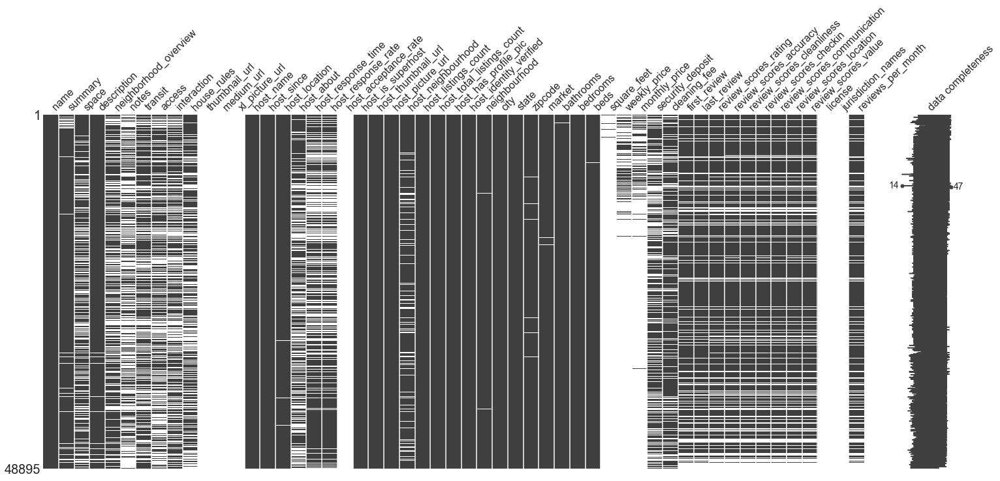

In [75]:
missingdata_df = listings_df.columns[listings_df.isnull().any()].tolist()
msno.matrix(listings_df[missingdata_df], labels=True)

Name, host_name, host_since, and the city and state appear to be completely populated,

The sparkline at right summarizes the general shape of the data completeness and points out the rows with the maximum and minimum nullity in the dataset.

This visualization will comfortably accommodate up to 50 labelled variables. Past that range labels begin to overlap or become unreadable, and by default large displays omit them.

# Bar Chart

msno.bar is a simple visualization of nullity by column:

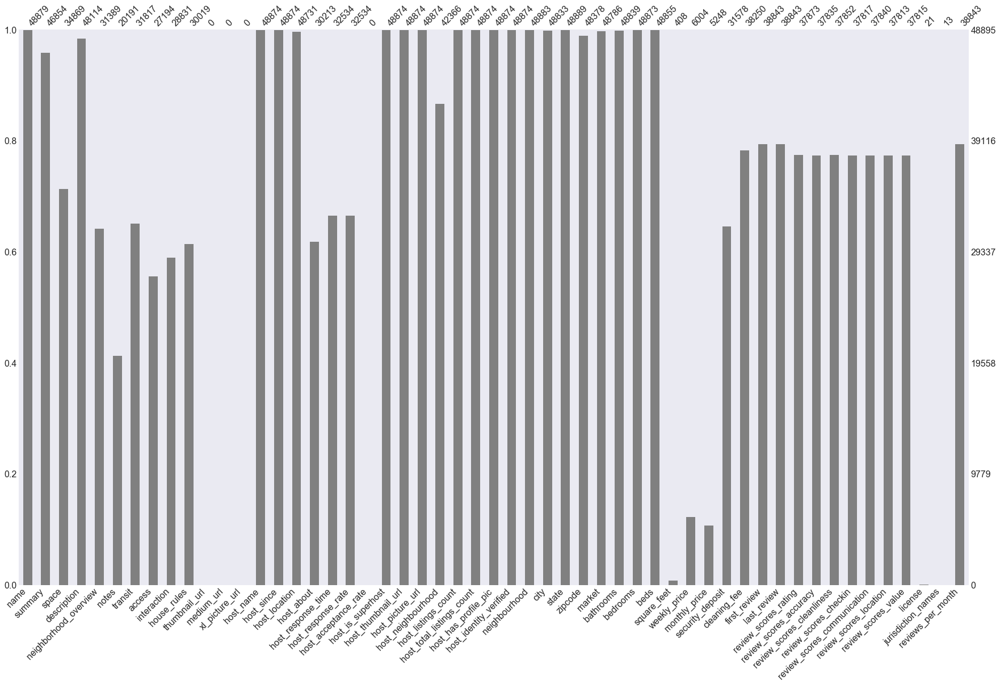

In [76]:
msno.bar(listings_df[missingdata_df], labels=True, color="grey", log=False, figsize=(30,18))

From the above bar chart we can observe that thumbnail_url, medium_url, xl_picture_url column have maximum null value.

# Heatmap

The missingno correlation heatmap measures nullity correlation: how strongly the presence or absence of one variable affects the presence of another:

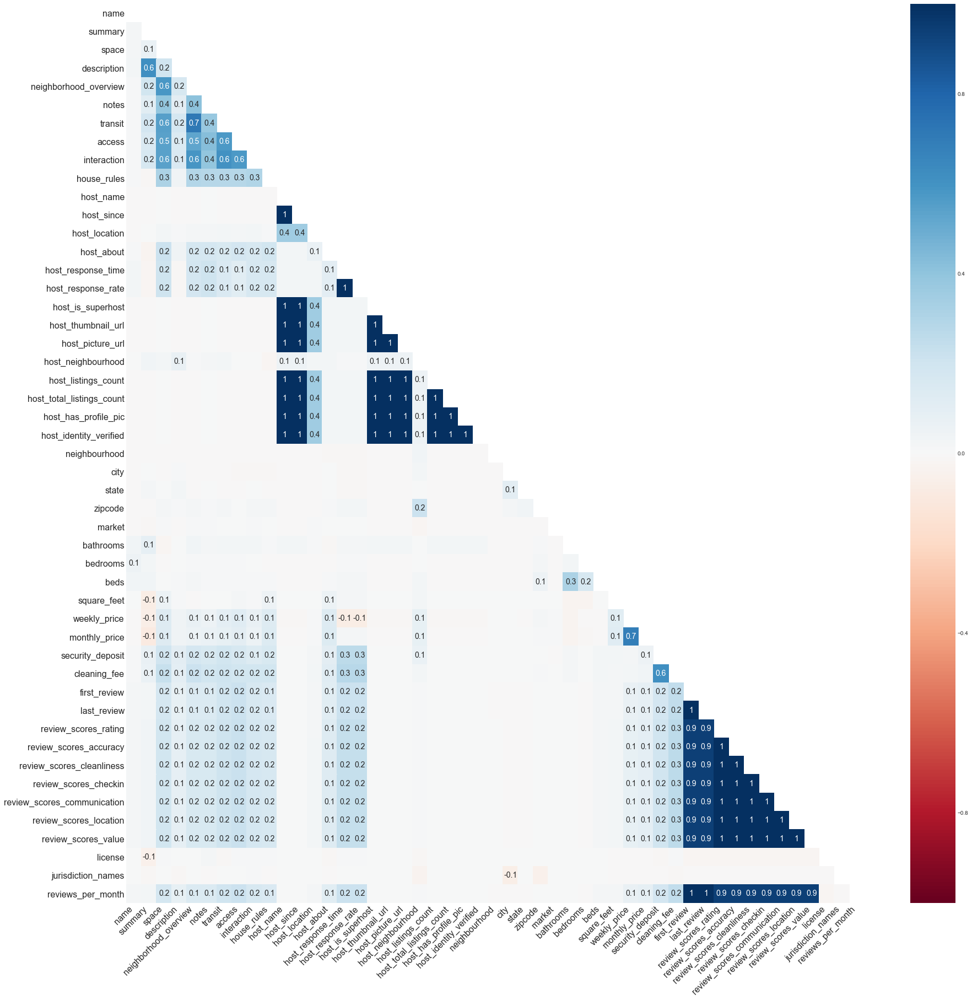

In [77]:
msno.heatmap(listings_df[missingdata_df],figsize=(30,30))

Variables that are always full or always empty have no meaningful correlation, and so are silently removed from the visualization

Nullity correlation ranges from -1 (if one variable appears the other definitely does not) to 0 (variables appearing or not appearing have no effect on one another) to 1 (if one variable appears the other definitely also does).

Entries marked <1 or >-1 are have a correlation that is close to being exactingly negative or positive, but is still not quite perfectly so. This points to a small number of records in the dataset which are erroneous.

# 5. Data Cleaning

# Data Issues

1) Given datasets do have different units of time in order to complete the analysis it required to be in common unit of time.

2) Variables price, weekly_price, monthly_price and cleaning_fee contain symbols such as "$" and ',' attached which would prevent these columns from being used for numerical analysis

3) Plenty of Missing values in weekly_price and monthly_price column.
Further we are solving the three data issues mentioned above.

In [78]:
###########################################################################
##
##  Convert different units of time in to Pandas datetime Object.
##  Convert the dates from strings to datetime objects.
##
###########################################################################

In [79]:
def convert_excel_time(excel_time):
    '''
    converts excel float format to pandas datetime object
    round to '1min' with 
    .dt.round('1min') to correct floating point conversion innaccuracy
    '''
    
    return pd.to_datetime('1899-12-30') + pd.to_timedelta(excel_time,'D')

def create_zip_timeseries(zip_data):
    # Extract only rows that correspond to New York
    zip_data = zip_data[zip_data['Metro'] == 'New York']
    # Extract only the data we need for the time series creation
    # i.e. drop the first 5 columns
    zip_time_series = zip_data.drop(zip_data.columns[:6], axis=1)
    # Transpose the DataFrame so that the columns become rows
    # We need the dates to be the index not the colum headers
    zip_time_series = zip_time_series.T
    # convert the dates from strings to datetime objects 
    zip_time_series.index = pd.to_datetime(zip_time_series.index, format='%Y-%m')
    # Rename the index to "Date"
    zip_time_series.index.rename('Date', inplace=True)
    return zip_time_series

def clean_zip(zip_data):
    # Extract only rows that correspond to New York
    zip_data_clean = zip_data[zip_data['Metro'] == 'New York']
    # Extract only the columns we need
    zip_data_clean = zip_data_clean[['RegionID', 'City', 'SizeRank']]
    return zip_data_clean


    

In [80]:
###########################################################################
## 
##  Variables price, weekly_price, monthly_price and cleaning_fee contain symbols such as "$" and ',' 
##  These attached which would prevent these columns from being used for numerical analysis.
##  So, we clean them in following snippet
## 
###########################################################################

In [81]:
def clean_listings(listings_data):
    # Extract only the rows that correspond to New York
    listings = listings_data[listings_data['state'] == 'NY']
    # Extract only the rows that correspond to 2 bedroom properties
    listings = listings[listings['bedrooms'] == 2]
    # Remove Dollat signs and commas from numbers (currently string data types)
    listings.replace('\$','', inplace=True, regex=True)
    listings.replace(',','',regex=True,inplace=True)
    # Convert relevant values from strings to "numeric" data type
    listings['price'] = listings['price'].apply(pd.to_numeric)
    listings['weekly_price'] = listings['weekly_price'].apply(pd.to_numeric)
    listings['monthly_price'] = listings['monthly_price'].apply(pd.to_numeric)
    # Convert dates from Excel format to datetime object
    listings['last_scraped'] = listings['last_scraped'].apply(convert_excel_time)
    # Set the "last_scraped" column as the DataFrame index
    listings.set_index('last_scraped', inplace=True)
    # Extract only the columns we need
    listings = listings[['cleaning_fee', 'extra_people',
                        'price', 'weekly_price', 'monthly_price',
                        'number_of_reviews',
                        'review_scores_rating',
                        'latitude', 'longitude',
                        'zipcode',
                        'neighbourhood_group_cleansed','bedrooms', 'square_feet','minimum_nights',
                        'maximum_nights']]  
###########################################################################
    ##
    ##  Here we deal with some missing values - we fill the missing price data 
    ##  for weekly and monthly columns by calculating the average multiple
    ##  of each with regards to the daily price for properties with available data.
    ##  We then fill the missing values by multipltying that property's 
    ##  daily price by the average multiple.
    ##
###########################################################################

    weekly_mult = listings['weekly_price'] / listings['price']
    monthly_mult = listings['monthly_price'] / listings['price']

    listings['weekly_price'] = np.where(listings['weekly_price'].isna(), 
                                             listings['price'] * weekly_mult.dropna().mean(), 
                                            listings['weekly_price'])

    listings['monthly_price'] = np.where(listings['monthly_price'].isna(), 
                                             listings['price'] * monthly_mult.dropna().mean(), 
                                            listings['monthly_price'])
    return listings

zip_df_clean = clean_zip(zip_df)
zip_time_series = create_zip_timeseries(zip_df)

listings_df_clean = clean_listings(listings_df)

# 6. Feature Engineering

# Sarima Model

Since cost is only provided till June 2017. Therefore I am using Time Series Forecasting to predict the price.

The various steps performed in the function are as follows:

1) Define SARIMA model to be used for prediction.

2) Fitting Model. 

3) we will assume that there is seasonality in the price and also that values depend not only on previous values (Auto Regressive AR) but also on diiferences between previous values (Moving Average MA)

So we apply SARIMA model to predict the cost of the properties in Zipcodes from July 2017 to next 28 months. 

In [82]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=ConvergenceWarning)

    prediction_series_list = []
    # define model configuration
    # set trend hyperparatmeters (my_order(p,d,q))
#     p: Trend autoregression order.
#     d: Trend difference order.
#     q: Trend moving average order.
    my_order = (1, 1, 1)
    # set seasonal hyperparatmeters (my_seasonal_order(P,D,Q,m))
#     P: Seasonal autoregressive order.
#     D: Seasonal difference order.
#     Q: Seasonal moving average order.
#     m: The number of time steps for a single seasonal period.
    my_seasonal_order = (1, 1, 1, 12)
    
    # iterate through each zipcode and run model to fit to avauilable
    # data and then predict 28 months out into future to reach current month
    for col in zip_time_series.columns:
        model = SARIMAX(zip_time_series[col].ffill().dropna(), order=my_order, 
                        seasonal_order=my_seasonal_order, freq='MS',
                       initialization='approximate_diffuse')
        # fit model
        model_fit = model.fit()
        yhat = model_fit.forecast(28)
        yhat.rename = col
        prediction_series_list.append(yhat)

C:\Users\manis\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\manis\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


We then attach the price of property in November 2019 (calculated at zipcode level) with each zipcode as a column to data known as current_price 

Its given in the instructions that we can assume an occupancy rate of 75%. By using this we are calculating bed2_avg_rent.

In [83]:
# The SARIMAX forecasts for each zip code are concatentated together
# and the last row of data (cirresnponding to last month's forecast values)
# are extracted, transposed and stored in a new DataFrame (current_prices)

prediction_df = pd.concat(prediction_series_list, axis=1)
prediction_df.columns = zip_time_series.columns
current_price = prediction_df.iloc[-1].to_frame()
current_price.columns = ['current_price']

# set up columns with dummy values
current_price['avg_rent'] = None
current_price['rent_to_value'] = None
current_price['no_for_rent'] = None

# iterate through each zip code in the value forecast DataFrame, extract the property listings from
# the listings_df_clean DataFrame that correspond that that zip code, calculate the average daiily rental price
# annualise it and appy the occupancy rate effect and store it in variable (bed2_avg_rent)
# Also record the number of proerty listings in each zip code and store (in bed2_count_rent)
# Then calculate the annual rental yield using the annualised average rent and dividing by the 
# average property price in that zip code - that is rent_to_value variable.

for zipcode in current_price.index:
    bed2_avg_rent = listings_df_clean[listings_df_clean['zipcode'] == str(int(zipcode))]['price'].mean() * 365 * 0.75
    bed2_count_rent = listings_df_clean[listings_df_clean['zipcode'] == str(int(zipcode))]['price'].count()
    rent_to_value = (bed2_avg_rent / current_price.loc[zipcode]['current_price']) * 100
    current_price.loc[zipcode, 'avg_rent'] = bed2_avg_rent
    current_price.loc[zipcode, 'rent_to_value'] = rent_to_value
    current_price.loc[zipcode, 'no_for_rent'] = bed2_count_rent
    
current_price.index.rename('postalCode', inplace=True)

# 7. Data Visualization

# Bubble Plot

A bubble plot is a scatterplot where a third dimension is added: the value of an additional variable is represented through the size of the dots. You need 3 numerical variables as input: one is represented by the X axis, one by the Y axis, and one by the size. Add a legend to make possible the link between the size and the value.

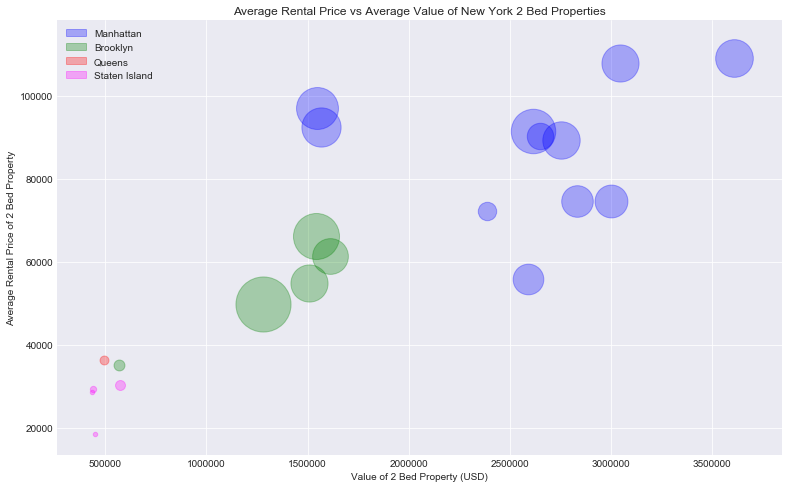

In [84]:

pc_borough_df = listings_df_clean[['neighbourhood_group_cleansed', 'zipcode']].copy()
pc_borough_df.drop_duplicates(subset=['zipcode'],inplace=True)
pc_borough_df.set_index('zipcode', inplace=True)


pc_borough_dict = pc_borough_df['neighbourhood_group_cleansed'].to_dict()

current_price['borough'] = current_price.index.map(pc_borough_dict)
#Plotting
x = current_price['current_price'].values
y = current_price['avg_rent'].values
colors = current_price['borough'].map({'Manhattan':'blue', 'Brooklyn':'green', 
                                       'Queens':'red', 'Staten Island':'magenta'})
sizes = 20 * current_price['no_for_rent'].values
categories = current_price['borough'].values
for i in range(len(current_price['current_price'].values)):
    
    plt.scatter([x[i]], [y[i]], c=[colors.values[i]],s=sizes[i], alpha=0.3)

Manhattan = mpatches.Patch(color='blue', label='Manhattan', alpha=0.3)
Brooklyn = mpatches.Patch(color='green', label='Brooklyn', alpha=0.3)
Queens = mpatches.Patch(color='red', label='Queens', alpha=0.3)
Staten = mpatches.Patch(color='magenta', label='Staten Island', alpha=0.3)

plt.title('Average Rental Price vs Average Value of New York 2 Bed Properties')
plt.xlabel('Value of 2 Bed Property (USD)')
plt.ylabel('Average Rental Price of 2 Bed Property')
plt.legend(handles=[Manhattan,Brooklyn,Queens,Staten])
plt.grid()
plt.show()

It can be observed from the above bubble plot that Manhattan have highest cost of two bedroom property and having highest rental price too followed by Brooklyn.

# Bar Chart

Using Vertical and Horizental bar chart to depict the relationship between zipcode and Number of Properties for rent.

In [85]:
rent_val_mapping  = current_price['rent_to_value'].to_dict()

In [86]:
listings_df_clean['rent_to_value'] = listings_df_clean['zipcode'].map(rent_val_mapping)

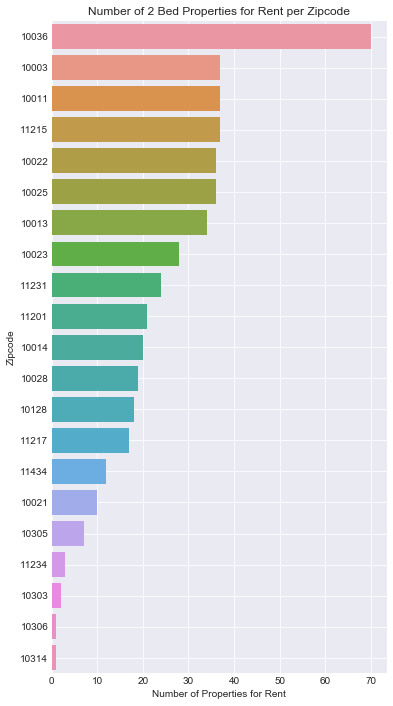

In [87]:
listings_df_clean_bar = listings_df_clean.dropna(subset=['rent_to_value']).copy()
listings_df_clean_bar['zipcode'] = listings_df_clean_bar['zipcode'].astype(int)
gb_df = listings_df_clean_bar.groupby('zipcode').agg('count')['neighbourhood_group_cleansed'].to_frame()
gb_df.index = [int(x) for x in gb_df.index]
gb_df.sort_values('neighbourhood_group_cleansed',inplace=True,ascending=False)
gb_df = gb_df.reset_index()
# Plotting
fig, ax = plt.subplots(figsize=(6,12))
sns.barplot(gb_df['neighbourhood_group_cleansed'],gb_df.index,orient='h')
ax.set_yticklabels(gb_df['index'])
plt.title('Number of 2 Bed Properties for Rent per Zipcode')
plt.xlabel('Number of Properties for Rent')
plt.ylabel('Zipcode')
plt.grid()
plt.show()

From the above bar chart we can conclude that zipcode 10036, 10003, 10011, 11215, 10022 have maximum number of properties available

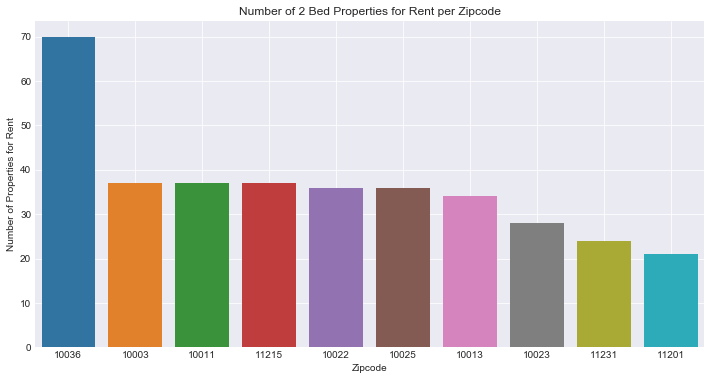

In [88]:
listings_df_clean_bar = listings_df_clean.copy().dropna(subset=['rent_to_value'])
listings_df_clean_bar['zipcode'] = listings_df_clean_bar['zipcode'].astype(int)
gb_df = listings_df_clean_bar.groupby('zipcode').agg('count')['neighbourhood_group_cleansed'].to_frame()
gb_df.index = [int(x) for x in gb_df.index]
gb_df.sort_values('neighbourhood_group_cleansed',inplace=True,ascending=False)
gb_df = gb_df.reset_index()
# Plotting
fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(gb_df.index[:10],gb_df['neighbourhood_group_cleansed'].iloc[:10])
ax.set_xticklabels(gb_df['index'])
plt.title('Number of 2 Bed Properties for Rent per Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Number of Properties for Rent')
plt.grid()
plt.show()

From the above bar chart we can conclude that zipcode 10036, 10003, 10011, 11215, 10022 have maximum number of properties available. 

The above two bar chart is same there is deifference in axis of orientation. Which help to understand the data easily.

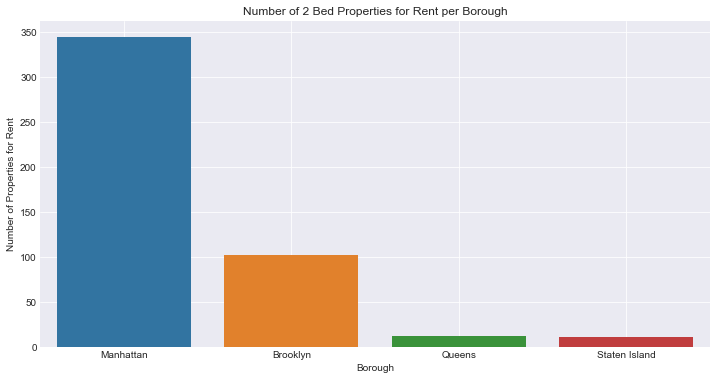

In [89]:
listings_df_clean_bar = listings_df_clean.dropna(subset=['rent_to_value']).copy()#
# listings_df_clean_bar['zipcode'] = listings_df_clean_bar['zipcode'].astype(int)
listings_df_clean_bar['borough'] = listings_df_clean_bar['zipcode'].map(pc_borough_dict)
gb_df = listings_df_clean_bar.groupby('borough').agg('count')['neighbourhood_group_cleansed'].to_frame()
# gb_df.index = [int(x) for x in gb_df.index]
# pc_borough_dict
gb_df.sort_values('neighbourhood_group_cleansed',inplace=True,ascending=False)
gb_df = gb_df.reset_index()
# Plotting
fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(gb_df.index,gb_df['neighbourhood_group_cleansed'])
ax.set_xticklabels(gb_df['borough'])
plt.title('Number of 2 Bed Properties for Rent per Borough')
plt.xlabel('Borough')
plt.ylabel('Number of Properties for Rent')
plt.grid()
plt.show()

From the above bar chart we can observe that Manhattan have the more Number of properties for rent followed by Brooklyn

We are Using Vertical and Horizental bar chart to depict the relationship between zipcode and Average Rent per 2 Bed Property.

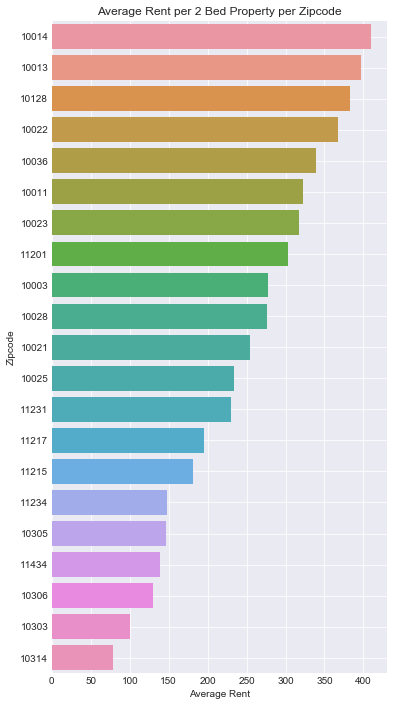

In [90]:
listings_df_clean_bar = listings_df_clean.dropna(subset=['rent_to_value']).copy()
listings_df_clean_bar['zipcode'] = listings_df_clean_bar['zipcode'].astype(int)
gb_df = listings_df_clean_bar.groupby('zipcode').agg(np.mean)['price'].to_frame()
gb_df.index = [int(x) for x in gb_df.index]
gb_df.sort_values('price',inplace=True,ascending=False)
gb_df = gb_df.reset_index()
# Plotting
fig, ax = plt.subplots(figsize=(6,12))
sns.barplot(gb_df['price'],gb_df.index,orient='h')
ax.set_yticklabels(gb_df['index'])
plt.title('Average Rent per 2 Bed Property per Zipcode')
plt.xlabel('Average Rent')
plt.ylabel('Zipcode')
plt.grid()
plt.show()

From the above bar chart we can conclude that zipcode 10014, 10013, 10128, 10022, 10036 have highest number of Average Rent.

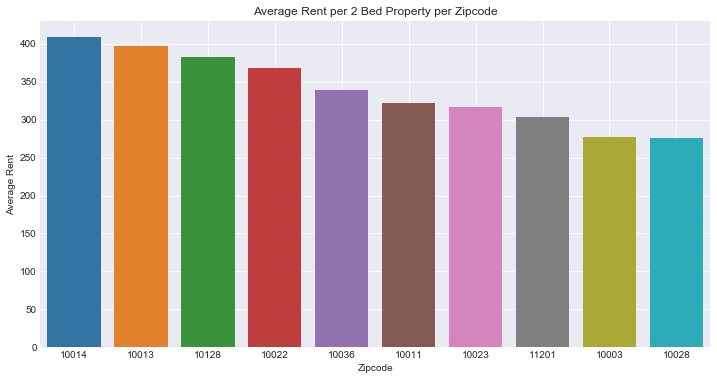

In [91]:
listings_df_clean_bar = listings_df_clean.dropna(subset=['rent_to_value']).copy()
listings_df_clean_bar['zipcode'] = listings_df_clean_bar['zipcode'].astype(int)
gb_df = listings_df_clean_bar.groupby('zipcode').agg(np.mean)['price'].to_frame()
gb_df.index = [int(x) for x in gb_df.index]
gb_df.sort_values('price',inplace=True,ascending=False)
gb_df = gb_df.reset_index()
# Plotting
fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(gb_df.index[:10],gb_df['price'].iloc[:10])
ax.set_xticklabels(gb_df['index'])
plt.title('Average Rent per 2 Bed Property per Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Average Rent')
plt.grid()
plt.show()

From the above bar chart we can conclude that zipcode 10014, 10013, 10128, 10022, 10036 have highest avergae rent. 

The above two bar chart is same there is deifference in axis of orientation. Which help to understand the data easily.

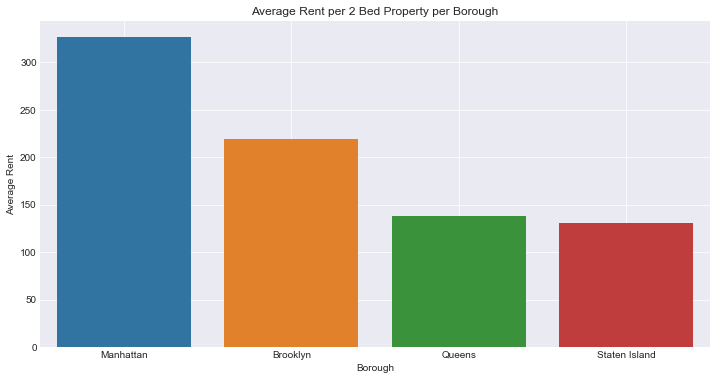

In [92]:
listings_df_clean_bar = listings_df_clean.dropna(subset=['rent_to_value']).copy()
# listings_df_clean_bar['zipcode'] = listings_df_clean_bar['zipcode'].astype(int)
listings_df_clean_bar['borough'] = listings_df_clean_bar['zipcode'].map(pc_borough_dict)
gb_df = listings_df_clean_bar.groupby('borough').agg(np.mean)['price'].to_frame()
# gb_df.index = [int(x) for x in gb_df.index]
# pc_borough_dict
gb_df.sort_values('price',inplace=True,ascending=False)
gb_df = gb_df.reset_index()
# Plotting
fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(gb_df.index,gb_df['price'])
ax.set_xticklabels(gb_df['borough'])
plt.title('Average Rent per 2 Bed Property per Borough')
plt.xlabel('Borough')
plt.ylabel('Average Rent')
plt.grid()
plt.show()

From the above bar chart we can observe that Manhattan have the more Number of properties for rent followed by Brooklyn

# Joyplots

Joyplots are stacked, partially overlapping density plots, simple as that. They are a nice way to plot data to visually compare distributions, especially those that change across one dimension (e.g., over time).

Joyplots is used to visualize the distribution of weekly_price and monthly_price.

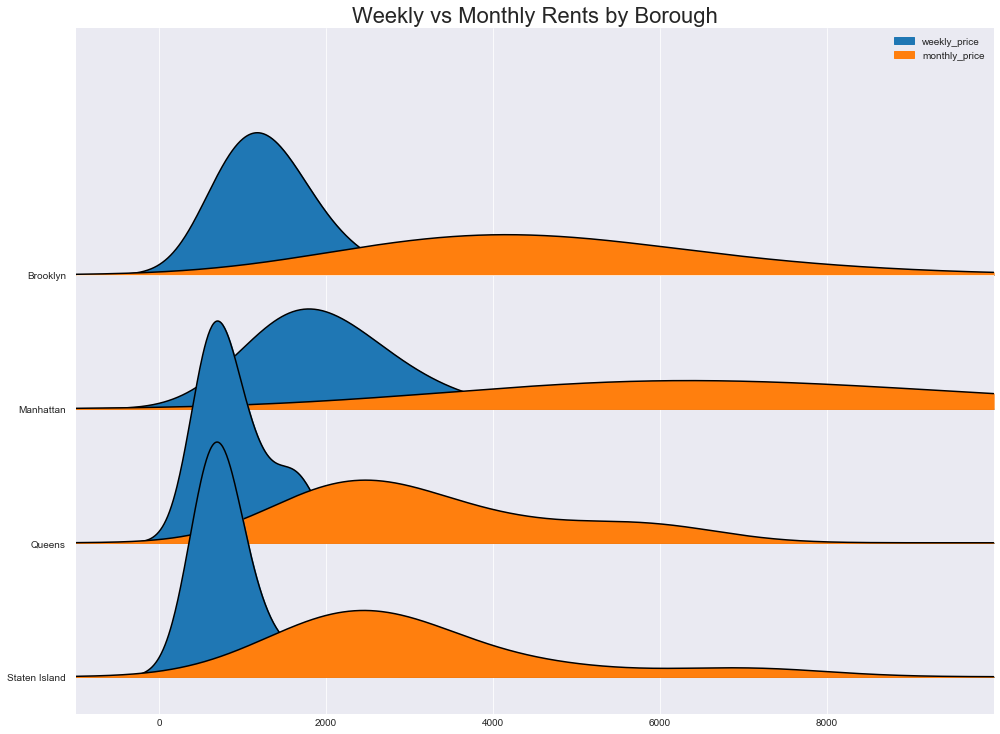

In [93]:
listings_df_clean_bar.replace(',','',regex=True,inplace=True)
listings_df_clean_bar[['weekly_price', 'monthly_price']] = listings_df_clean_bar[['weekly_price', 'monthly_price']].astype(float)
# Draw Plot
plt.figure(figsize=(16,10), dpi= 80)
fig, axes = joypy.joyplot(listings_df_clean_bar, column=['weekly_price','monthly_price'], 
                          by="borough", ylim='max', figsize=(14,10),fill=True, 
                          overlap=3,grid=True, x_range=range(-1000,10000), legend=True)

# Decoration
plt.title('Weekly vs Monthly Rents by Borough', fontsize=22)
plt.show()

From the above joyplot we can infer that Manhattan have both highest weekly_price and monthly_price followed by Brooklyn.

# Pairplot

The pairplot function creates a grid of Axes such that each variable in data will by shared in the y-axis across a single row and in the x-axis across a single column

The above pairplot is used to visualize the different coulumn like price, number_of_reviews and review_scores_rating.

C:\Users\manis\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\Users\manis\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


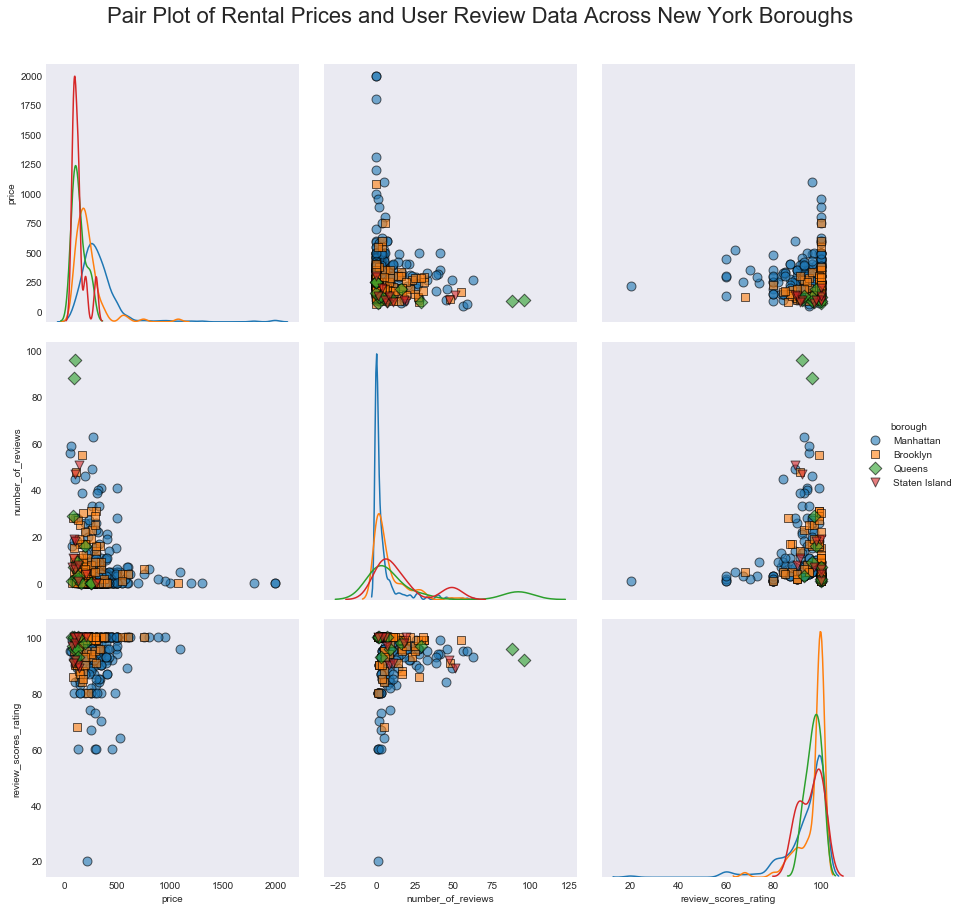

In [94]:
# Plotting
mpl.rcParams['figure.figsize'] = (5,5)
sns.pairplot(listings_df_clean_bar, vars =['price', 
                'number_of_reviews', 'review_scores_rating'],
             diag_kind='kde',
            hue='borough',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4,
            markers=["o", "s", "D", "v"])
plt.suptitle('Pair Plot of Rental Prices and User Review Data Across New York Boroughs', y=1.05,
             size = 22);

The closer it is to 1 or -1, the stronger the linear relation. The closer it is to 0, the weaker the relation. If there is a value close to 1 or -1, then we can safely assume that these two variables are linearly connected. If it is close to 0, we can assume the absence of linear relation. The main-diagonal elements of the correlation matrix show the autocorrelation of each attribute, thus a measure of its normalized spread around its mean value. The non diagonal elements (i,j) show the linear correlation between the attributes i and j.

# Violinplot

Violinplot shows the distribution of quantitative data across several levels of one (or more) categorical variables such that those distributions can be compared. Unlike a box plot, in which all of the plot components correspond to actual datapoints, the violin plot features a kernel density estimation of the underlying distribution.

Violinplot used to depict the relationship between Price and Borough.

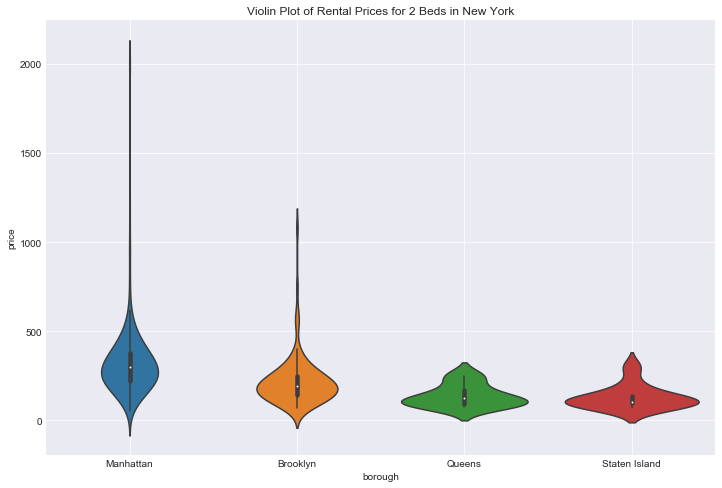

In [95]:
listings_df_clean_bar = listings_df_clean_bar[(listings_df_clean_bar['price'] > 0) & (listings_df_clean_bar['price'] < 9999)]
#Plotting
fig, ax = plt.subplots(figsize=(12,8))
sns.violinplot(x="borough",y="price",data=listings_df_clean_bar[['price','borough']],         
              ax=ax)
plt.title('Violin Plot of Rental Prices for 2 Beds in New York')
plt.grid()
plt.show()

From the above plot it can be observed that mean, median and inner quartile range all are larger in number for Manhattan followed by Brooklyn as compared to other. So we conclude that Manhattan have highest rental price for two bedroom in New York.

# Map

##### The map below shows heatmap coloured by the annual rental yield (%)

In [44]:
# create dictionary containing zip codes as the keys and the rant to value ratio (i.e. annual rental yields)
# as values. We use this then to map acrosss the annual rental yield for each zip code into the
# property listings DataFrame so that we assing that zip codes annual rental yield value
# to each row of data for which the property lies within that zip code.
yield_map = current_price['rent_to_value'].to_dict()
listings_df_clean['rent_to_value'] = listings_df_clean['zipcode'].map(yield_map)
# Plotting
# set the centre of the map with lattitude and longitude values (central New York)
m = Map(center = (40.74749, -73.97237))
# create a heatmap layer which marks the location of each listed property by lattitude
# and longitude and displays "heat" based upon the "rent_to_value" (i.e. annuakl rental yield)
# that corresponds to that zip code.
heatmap = Heatmap(
    locations=[[x[0], x[1], x[2]]  for x in listings_df_clean[['latitude','longitude', 'rent_to_value']].dropna().values],
    radius=0)
m.add_layer(heatmap);
m.add_control(FullScreenControl())
zoom_slider = IntSlider(description='Zoom level:', min=0, max=15, value=12)
jslink((zoom_slider, 'value'), (m, 'zoom'))
widget_control1 = WidgetControl(widget=zoom_slider, position='topright')
m.add_control(widget_control1)
m

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

The above map depicts that red color have the highest rental income followed by yellow and its the most profitable area for the investment or buying property. Blue have the lowest rental income so it's least profitable area for the investment.

So the colours gets "colder" the rental income will falls. Like Red -> Yellow -> Green -> Blue (Rent Decreases) 

# 8. Conclusion:

**Zipcodes 10314, 10303, 10306 and 11434 have average rent per 2 bed property is very low. So if the company have financial constraints then it should invest in buying properties in these zipcodes.**

**If the company is willing to buy properties having high cost then they should invest in Zipcodes 10014, 10013, 10128 and 10022 because these Zipcode have average rent per 2 bed property is very high. It will provide very high return as the rent is very high.**


# 9. Summary:

The goal of this data analysis is to identify the zipcodes for real estate company that wants to purchase properties in New York city and rent them to have high short term gains. Airbnb data and Zillow data were available for data analysis. In the initial step data assessing is performed in which it was observed that given datasets have mainly two type of issues first is quality issues and second is tidiness issues. Then the data were pre-processed, cleaned to remove unnecessary symbols and impute missing values and common unit of time in dataframe. we fill the missing price data for weekly and monthly columns by calculating the average multiple of each with regards to the daily price for properties with available data. We then fill the missing values by multipltying that property's daily price by the average multiple. Zillow datasets consists of price till june 2017 to calculate the further price we used time series forecasting(SARIMA) model. By using this model we predict the price till november 2019. We then attach the price of property in November 2019 (calculated at zipcode level) with each zipcode as a column to data known as current_price. In the final step, Exploratory Data Analysis was perform using interactive plots and visualisation to figure out which zipcodes have high rental income. It can be observed from the above visualization that high return investment zipcodes should have enough number of properties but also have high return on investment. **From the above graphs, it is concluded that zipcodes 10022, 10036, 10011, 10003, 10013 and 11201 are great for investment to gain high profit on Investment and have sufficient number of properties also** .

# 10.  Future Recommendation:

In the project specification it is given that each prperty is homogenous with in a zipcode. In my opinion there is some flaws in this assumption because the cost of prperty depends upon number factors such as which type of building it is for example houses, apartments or condos. If the building have more restroom it will cost more. In addition to that it is not mentioned that wether the flat is furnished or not, rent also depends upon various factor like the amount of equipment, decoration, furniture and electric appliances present in the house. From my point of view there should be more clearity needed on the above point and price should not be homogenous. Occupancy rate is given of 75% In future it should be increases also. Other factor that is not mention in the dataset is pollution levels, crime levels and average income because these things also decide rent or cost of property. In future if I have a time i would like to explore these things in depth to calculate the more accurate price or rent of property in particular zipcode.